In [1]:
import hashlib

import numpy as np

import pandas as pd
from pandas.api.types import CategoricalDtype

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import linear_model as lm
import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

import zipfile
import os

In [2]:
with zipfile.ZipFile('data/cook_county_data.zip') as item:
    item.extractall()

In [3]:
training_data = pd.read_csv("cook_county_train.csv", index_col='Unnamed: 0')

In [4]:
training_data.columns.values

array(['PIN', 'Property Class', 'Neighborhood Code', 'Land Square Feet',
       'Town Code', 'Apartments', 'Wall Material', 'Roof Material',
       'Basement', 'Basement Finish', 'Central Heating', 'Other Heating',
       'Central Air', 'Fireplaces', 'Attic Type', 'Attic Finish',
       'Design Plan', 'Cathedral Ceiling', 'Construction Quality',
       'Site Desirability', 'Garage 1 Size', 'Garage 1 Material',
       'Garage 1 Attachment', 'Garage 1 Area', 'Garage 2 Size',
       'Garage 2 Material', 'Garage 2 Attachment', 'Garage 2 Area',
       'Porch', 'Other Improvements', 'Building Square Feet',
       'Repair Condition', 'Multi Code', 'Number of Commercial Units',
       'Estimate (Land)', 'Estimate (Building)', 'Deed No.', 'Sale Price',
       'Longitude', 'Latitude', 'Census Tract',
       'Multi Property Indicator', 'Modeling Group', 'Age', 'Use',
       "O'Hare Noise", 'Floodplain', 'Road Proximity', 'Sale Year',
       'Sale Quarter', 'Sale Half-Year', 'Sale Quarter of Year'

# Exploratory Data Analysis

In [5]:
def plot_distribution(data, label):
    fig, axs = plt.subplots(nrows=2)

    sns.distplot(
        data[label], 
        ax=axs[0]
    )
    sns.boxplot(
        x=data[label],
        width=0.3, 
        ax=axs[1],
        showfliers=False,
    )

    # Align axes
    spacer = np.max(data[label]) * 0.05
    xmin = np.min(data[label]) - spacer
    xmax = np.max(data[label]) + spacer
    axs[0].set_xlim((xmin, xmax))
    axs[1].set_xlim((xmin, xmax))

    # Remove some axis text
    axs[0].xaxis.set_visible(False)
    axs[0].yaxis.set_visible(False)
    axs[1].yaxis.set_visible(False)

    # Put the two plots together
    plt.subplots_adjust(hspace=0)
    fig.suptitle("Distribution of " + label)

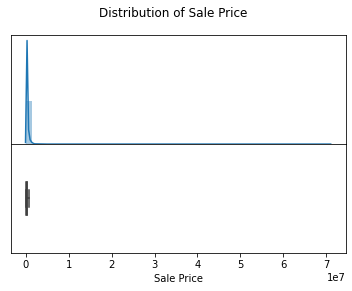

In [6]:
plot_distribution(training_data, label='Sale Price')

In [7]:
training_data['Sale Price'].describe()

count    2.047920e+05
mean     2.451646e+05
std      3.628694e+05
min      1.000000e+00
25%      4.520000e+04
50%      1.750000e+05
75%      3.120000e+05
max      7.100000e+07
Name: Sale Price, dtype: float64

In [8]:
training_data = training_data[training_data["Sale Price"] >= 500]
training_data["Log Sale Price"] = np.log(training_data["Sale Price"])

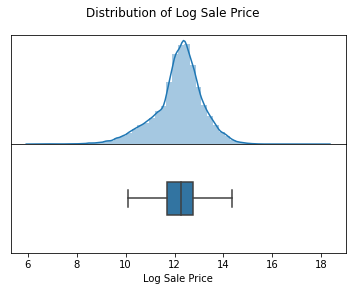

In [9]:
plot_distribution(training_data, label='Log Sale Price')

In [10]:
training_data['Log Building Square Feet'] = np.log(training_data['Building Square Feet'])

# Feature Engineering

In [11]:
# Copy the first 10 rows to use as an example set
example_df = training_data[["Description"]][:10].copy()

# Create a Regex with the format of the bathroom information
bathrooms_regex = r'and (\d+\.\d) of which are bathrooms.'

# Extract the bathroom information from the "Description" column
example_output = example_df["Description"].str.extract(bathrooms_regex).astype(float)

example_output

,0
1,1.0
2,1.0
3,1.5
4,1.0
6,1.5
7,2.5
8,2.0
9,1.5
10,1.0
11,1.0


In [12]:
#This property, sold on 10/11/2016, is a two-story houeshold located at 123 S LANCASTER AVE.
#It has a total of 9 rooms, 4 of which are bedrooms, and 2.5 of which are bathrooms.

#bathrooms_regex = r'and (\d+\.\d) of which are bathrooms.'
def add_total_bedrooms(data):
    """
    Input:
      data (data frame): a data frame containing at least the Description column.
    """
    with_rooms = data.copy()
    rooms_regex = r'(\d+) of which are bedrooms,'
    rooms = data["Description"].str.extract(rooms_regex).astype(float)
    
    with_rooms['Bedrooms'] = rooms
    
    return with_rooms

training_data = add_total_bedrooms(training_data)
training_data["Bedrooms"].max()

14.0

In [13]:
def plot_logsaleprice(data):
    fig, axs = plt.subplots(nrows=2)
    plt.figure(figsize =(10,6))

    sns.boxplot(
        x='Bedrooms',
        y='Log Sale Price',
        data=data,
        ax=axs[0],
    )
    axs[0].set_title("Bedrooms vs Log Sale Price")

    sns.countplot(
        x='Bedrooms',
        data=data,
        ax=axs[1],
    )

    # Draw median price
    axs[0].axhline(
        y=training_data['Log Sale Price'].median(), 
        color='red',
        linestyle='dotted'
    )

    # Label the bars with counts
    for patch in axs[1].patches:
        x = patch.get_bbox().get_points()[:, 0]
        y = patch.get_bbox().get_points()[1, 1]
        axs[1].annotate(f'{int(y)}', (x.mean(), y), ha='center', va='bottom')

    # Format x-axes
    axs[1].set_xticklabels(axs[1].xaxis.get_majorticklabels(), rotation=90)
    axs[0].xaxis.set_visible(False)

    # Narrow the gap between the plots
    plt.subplots_adjust(hspace=0.01)

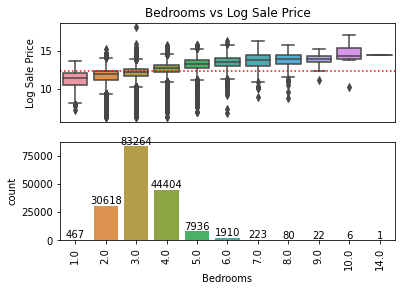

<Figure size 720x432 with 0 Axes>

In [14]:
plot_logsaleprice(training_data)

In [15]:
num_neighborhoods = len(training_data["Neighborhood Code"].unique())
num_neighborhoods

193

In [16]:
def plot_categorical(neighborhoods):
    fig, axs = plt.subplots(nrows=2)

    sns.boxplot(
        x='Neighborhood Code',
        y='Log Sale Price',
        data=neighborhoods,
        ax=axs[0],
    )

    sns.countplot(
        x='Neighborhood Code',
        data=neighborhoods,
        ax=axs[1],
    )

    # Draw median price
    axs[0].axhline(
        y=training_data['Log Sale Price'].median(), 
        color='red',
        linestyle='dotted'
    )

    # Label the bars with counts
    for patch in axs[1].patches:
        x = patch.get_bbox().get_points()[:, 0]
        y = patch.get_bbox().get_points()[1, 1]
        axs[1].annotate(f'{int(y)}', (x.mean(), y), ha='center', va='bottom')

    # Format x-axes
    axs[1].set_xticklabels(axs[1].xaxis.get_majorticklabels(), rotation=90)
    axs[0].xaxis.set_visible(False)

    # Narrow the gap between the plots
    plt.subplots_adjust(hspace=0.01)

In [17]:
top20 = training_data["Neighborhood Code"].value_counts().index[0:20]
in_top_20_neighborhoods = training_data[training_data["Neighborhood Code"].isin(top20)]
in_top_20_neighborhoods

,PIN,Property Class,Neighborhood Code,Land Square Feet,Town Code,Apartments,Wall Material,Roof Material,Basement,Basement Finish,...,Age Decade,Pure Market Filter,Garage Indicator,Neigborhood Code (mapping),Town and Neighborhood,Description,Lot Size,Log Sale Price,Log Building Square Feet,Bedrooms
1,13272240180000,202,120,3780.0,71,0.0,2.0,1.0,1.0,1.0,...,9.6,1,1.0,120,71120,"This property, sold on 05/23/2018, is a one-st...",3780.0,12.560244,6.904751,3.0
4,31361040550000,202,120,8400.0,32,0.0,3.0,1.0,2.0,3.0,...,6.3,1,1.0,120,32120,"This property, sold on 06/10/2016, is a one-st...",8400.0,10.025705,6.855409,2.0
8,13232040260000,205,70,3100.0,71,0.0,2.0,2.0,1.0,3.0,...,10.0,1,1.0,70,7170,"This property, sold on 08/25/2016, is a two-st...",3100.0,13.422468,7.636270,4.0
10,19074270080000,202,380,3750.0,72,0.0,1.0,1.0,2.0,3.0,...,7.4,1,1.0,380,72380,"This property, sold on 05/01/2017, is a one-st...",3750.0,11.695247,6.841615,2.0
11,15083050330000,203,20,5092.0,31,0.0,2.0,1.0,1.0,1.0,...,5.8,1,1.0,20,3120,"This property, sold on 04/29/2014, is a one-st...",5092.0,11.184421,6.911747,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204781,20361190390000,203,80,4405.0,70,0.0,2.0,1.0,1.0,3.0,...,5.7,1,1.0,80,7080,"This property, sold on 07/15/2013, is a one-st...",4405.0,10.913269,7.141245,3.0
204785,9284030280000,202,40,6650.0,22,0.0,1.0,1.0,1.0,3.0,...,6.1,1,1.0,40,2240,"This property, sold on 04/03/2014, is a one-st...",6650.0,11.736069,6.761573,3.0
204786,8141120110000,203,100,10010.0,16,0.0,2.0,1.0,1.0,1.0,...,5.6,1,1.0,100,16100,"This property, sold on 09/08/2016, is a one-st...",10010.0,12.568978,6.948897,3.0
204790,9242030500000,203,80,6650.0,22,0.0,2.0,1.0,1.0,3.0,...,6.0,1,1.0,80,2280,"This property, sold on 02/22/2018, is a one-st...",6650.0,12.879017,7.092574,3.0


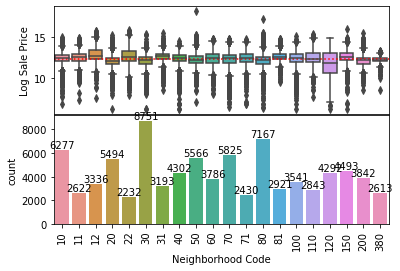

In [18]:
plot_categorical(neighborhoods=in_top_20_neighborhoods)

In [19]:
def find_expensive_neighborhoods(data, n=3, metric=np.median):
    """
    Input:
      data (data frame): should contain at least a string-valued 'Neighborhood Code'
        and a numeric 'Sale Price' column
      n (int): the number of top values desired
      metric (function): function used for aggregating the data in each neighborhood.
        for example, np.median for median prices
    
    Output:
      a list of the the neighborhood codes of the top n highest-priced neighborhoods as measured by the metric function
    """
    neighborhoods = []
    filtered_data = data.groupby(["Neighborhood Code"])["Sale Price"].apply(metric).sort_values(ascending = False).index[0:n]
    for i in range(n):
        value = filtered_data[i]
        neighborhoods.append(value)
    return [int(code) for code in neighborhoods]
expensive_neighborhoods = find_expensive_neighborhoods(training_data, 3, np.median)
expensive_neighborhoods

[44, 94, 93]

In [20]:
def add_in_expensive_neighborhood(data, neighborhoods):
    """
    Input:
      data (data frame): a data frame containing a 'Neighborhood Code' column with values
        found in the codebook
      neighborhoods (list of strings): strings should be the names of neighborhoods
        pre-identified as expensive
    Output:
      data frame identical to the input with the addition of a binary
      in_expensive_neighborhood column
    """
    data['in_expensive_neighborhood'] = data['Neighborhood Code'].isin(neighborhoods).astype(int)
    return data

expensive_neighborhoods = find_expensive_neighborhoods(training_data, 3, np.median)
training_data = add_in_expensive_neighborhood(training_data, expensive_neighborhoods)

training_data.head()

len(training_data[training_data["in_expensive_neighborhood"]==1])

1290

In [21]:
def substitute_roof_material(data):
    """
    Input:
      data (data frame): a data frame containing a 'Roof Material' column.  Its values
                         should be limited to those found in the codebook
    Output:
      data frame identical to the input except with a refactored 'Roof Material' column
    """
    copy = data.copy()
    
    mapping = {
        1: 'Shingle/Asphalt',
        2: 'Tar&Gravel',
        3: 'Slate',
        4: 'Shake',
        5: 'Tile',
        6: 'Other'
    }
    
    copy['Roof Material'] = copy['Roof Material'].replace(mapping)
    return copy
    
training_data = substitute_roof_material(training_data)
training_data.head()

,PIN,Property Class,Neighborhood Code,Land Square Feet,Town Code,Apartments,Wall Material,Roof Material,Basement,Basement Finish,...,Pure Market Filter,Garage Indicator,Neigborhood Code (mapping),Town and Neighborhood,Description,Lot Size,Log Sale Price,Log Building Square Feet,Bedrooms,in_expensive_neighborhood
1,13272240180000,202,120,3780.0,71,0.0,2.0,Shingle/Asphalt,1.0,1.0,...,1,1.0,120,71120,"This property, sold on 05/23/2018, is a one-st...",3780.0,12.560244,6.904751,3.0,0
2,25221150230000,202,210,4375.0,70,0.0,2.0,Shingle/Asphalt,2.0,3.0,...,1,1.0,210,70210,"This property, sold on 02/18/2016, is a one-st...",4375.0,9.998798,6.810142,3.0,0
3,10251130030000,203,220,4375.0,17,0.0,3.0,Shingle/Asphalt,1.0,3.0,...,1,1.0,220,17220,"This property, sold on 07/23/2013, is a one-st...",4375.0,12.323856,7.068172,3.0,0
4,31361040550000,202,120,8400.0,32,0.0,3.0,Shingle/Asphalt,2.0,3.0,...,1,1.0,120,32120,"This property, sold on 06/10/2016, is a one-st...",8400.0,10.025705,6.855409,2.0,0
6,30314240080000,203,181,10890.0,37,0.0,1.0,Shingle/Asphalt,1.0,3.0,...,1,1.0,181,37181,"This property, sold on 10/26/2017, is a one-st...",10890.0,11.512925,7.458186,4.0,0


# One Hot Encoding

In [22]:
from sklearn.preprocessing import OneHotEncoder

oh_enc = OneHotEncoder()
oh_enc.fit([['Anirudhan'], ['Dominic'], ['Rahul'], ['Rahul'], ['Anirudhan'], ['Yike'], ['Vasanth']]);
oh_enc.transform([['Anirudhan'], ['Rahul'], ['Dominic']]).toarray()

array([[1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 1., 0., 0., 0.]])

In [23]:
def ohe_roof_material(data):
    """
    One-hot-encodes roof material.  New columns are of the form "Roof Material_MATERIAL"
    """
    ohe = OneHotEncoder()
    ohe.fit(data[["Roof Material"]])
    #encoded_roofmaterial_df = pd.DataFrame(oh_enc.transform(data[["Roof Material"]]).toarray(),columns=ohe.get_feature_names_out(),index = data.index)
    new_df = pd.DataFrame(ohe.transform(data[["Roof Material"]]).toarray(),
                            columns=ohe.get_feature_names_out(),
                            index = data.index)
    
    encoded_roofmaterial_df = pd.concat([data, new_df], axis=1)
    
    return encoded_roofmaterial_df

training_data_ohe = ohe_roof_material(training_data)
#This line of code will display only the one-hot-encoded columns in training_data_ohe that 
# have names that begin with “Roof Material_" 
training_data_ohe.filter(regex='^Roof Material_').head(5)

,Roof Material_Other,Roof Material_Shake,Roof Material_Shingle/Asphalt,Roof Material_Slate,Roof Material_Tar&Gravel,Roof Material_Tile
1,0.0,0.0,1.0,0.0,0.0,0.0
2,0.0,0.0,1.0,0.0,0.0,0.0
3,0.0,0.0,1.0,0.0,0.0,0.0
4,0.0,0.0,1.0,0.0,0.0,0.0
6,0.0,0.0,1.0,0.0,0.0,0.0


In [24]:
training_val_data = pd.read_csv("cook_county_train_val.csv", index_col='Unnamed: 0')
test_data = pd.read_csv("cook_county_contest_test.csv", index_col='Unnamed: 0')

# More Exploratory Data Analysis

In [25]:
# training_val_data['Sale Price'].isnull()
training_val_data['Sale Price'].isnull().sum() + (training_val_data['Sale Price'] <= 0).sum()

q1 = np.percentile(training_val_data['Sale Price'],25)
q3 = np.percentile(training_val_data['Sale Price'],75)
iqr = q3 - q1
use_iqr = iqr * 1.5
upper_bound = q3 + use_iqr
print((training_val_data['Sale Price'] >= upper_bound).sum()) #Result is 12229

# lower_bound = q1 - use_iqr
# since q1 - use_iqr is less than 0, we cannot have a negative price for a house so I will use a cutoff of 1000
lower_bound = 1000
print((training_val_data['Sale Price'] <= lower_bound).sum())

12229
35921


In [26]:
max_Sale_Price_filtered = (training_val_data.loc[training_val_data['Pure Market Filter'] == 1])['Sale Price'].max()

min_Sale_Price_filtered = (training_val_data.loc[training_val_data['Pure Market Filter'] == 1])['Sale Price'].min()

In [27]:
print(max_Sale_Price_filtered)
print(min_Sale_Price_filtered)

8490078
10003


# Training/Validation Split

In [28]:
def train_val_split(data):
    """ 
    Takes in a DataFrame `data` and randomly splits it into two smaller DataFrames 
    named `train` and `validation` with 80% and 20% of the data, respectively. 
    """
    data_len = data.shape[0]
    shuffled_indices = np.random.permutation(data_len)
    
    train_indices = shuffled_indices[:int(data_len * 0.8)]
    validation_indices = shuffled_indices[int(data_len * 0.8):]
    
    
    train = data.iloc[train_indices] 
    validation = data.iloc[validation_indices] 
    return train, validation

 
#This makes the train-test split in this section reproducible across different runs 
# of the notebook.
np.random.seed(1337)

train, valid = train_val_split(training_val_data)

In [29]:
def process_data_m1(data):
    """ 
    Takes in a DataFrame `data` and performs data transformations and processing to use for Model 1
    """
    
    # Remove outliers
    data1 = data[data['Pure Market Filter']==1]
    
    # Create Log Sale Price column
    data1["Log Sale Price"] = np.log(data1["Sale Price"])
    
    # Create Log Building Square Feet column
    data1["Log Building Square Feet"] = np.log(data1["Building Square Feet"])
    
    # Select columns for the model
    data1 = data1[['Log Building Square Feet', 'Log Sale Price']]
    
    return data1



# Process both the training and validation data 
processed_train_m1 = process_data_m1(train)

processed_val_m1 = process_data_m1(valid)


# Create X (dataframe) and Y (series) to input into model
X_train_m1 = processed_train_m1.drop(columns = "Log Sale Price")
Y_train_m1 = processed_train_m1["Log Sale Price"]

X_valid_m1 = processed_val_m1.drop(columns = "Log Sale Price")
Y_valid_m1 = processed_val_m1["Log Sale Price"]

# Take a look at the result
display(X_train_m1.head())
display(Y_train_m1.head())

display(X_valid_m1.head())
display(Y_valid_m1.head())

,Log Building Square Feet
130829,7.870166
193890,7.002156
30507,6.851185
91308,7.228388
131132,7.990915


130829    12.994530
193890    11.848683
30507     11.813030
91308     13.060488
131132    12.516861
Name: Log Sale Price, dtype: float64

,Log Building Square Feet
50636,7.310550
82485,7.325808
193966,7.090077
160612,7.281386
7028,7.118016


50636     11.682668
82485     12.820655
193966     9.825526
160612    12.468437
7028      12.254863
Name: Log Sale Price, dtype: float64

# Creating a Linear Model

In [30]:
linear_model_m1 = lm.LinearRegression(fit_intercept=True)

# Fit the model using the processed training data
X = processed_train_m1[['Log Building Square Feet']]
Y = processed_train_m1['Log Sale Price']
linear_model_m1.fit(X,Y)

# Compute the predicted y values from linear model 1 (in units log sale price) using the training data and 
# again using the validation data:

Y_predict_train_m1 = linear_model_m1.predict(X)

Y_predict_valid_m1 = linear_model_m1.predict(processed_val_m1[['Log Building Square Feet']])

# Model Evaluation Using RMSE

In [31]:
def rmse(predicted, actual):
    """
    Calculates RMSE from actual and predicted values
    Input:
      predicted (1D array): vector of predicted/fitted values
      actual (1D array): vector of actual values
    Output:
      a float, the root-mean square error
    """
    return np.sqrt(np.mean((predicted - actual)**2))

In [32]:
model_names=["M1: log(bsqft)", "M2", "M3"]

# Create arrays where we can keep track of training and validation RMSE for each model

training_error_log = np.zeros(4)
validation_error_log = np.zeros(4)

training_error = np.zeros(4)
validation_error = np.zeros(4)

# Array to track cross validation errors average RMSE errors  

cv_error = np.zeros(4)

In [33]:
# Training and validation RMSE for the model (in units log sale price)

training_error_log[0] = rmse(Y_predict_train_m1, Y_train_m1)
validation_error_log[0]= rmse(Y_predict_valid_m1, Y_valid_m1)

# Training and validation RMSE for the model (in its original dollar values before the log transform)

training_error[0] = rmse(np.exp(Y_predict_train_m1), np.exp(Y_train_m1))
validation_error[0] = rmse(np.exp(Y_predict_valid_m1), np.exp(Y_valid_m1))

# Cross Validation

In [34]:
from sklearn.model_selection import KFold
from sklearn.base import clone

def cross_validate_rmse(model, X, y):
    model = clone(model)
    five_fold = KFold(n_splits=5) 
    de_logged_rmse_values = []
    for tr_ind, va_ind in five_fold.split(X):
        model.fit(X.iloc[tr_ind,:], y.iloc[tr_ind])
        de_logged_rmse_values.append(rmse(np.exp(y.iloc[va_ind]), np.exp(model.predict(X.iloc[va_ind,:]))))
    return np.mean(de_logged_rmse_values)


# Create a new model to fit on the whole training_val dataset
linear_model_m1_cv = lm.LinearRegression(fit_intercept=True)


# Process the entire training_val dataset using the pipeline
processed_full_m1 = process_data_m1(training_val_data)


# Split into X and Y:
X_full_m1 = processed_full_m1.drop(columns = "Log Sale Price")
Y_full_m1 = processed_full_m1["Log Sale Price"]

# DO NOT CHANGE THIS LINE - it ensures reproducibility 
np.random.seed(1330)

# Run Cross Validation and Output RMSE (in units of Sale Price):
cv_error[0] = cross_validate_rmse(linear_model_m1_cv, X_full_m1, Y_full_m1)
print("1st Model Cross Validation RMSE: {}".format(cv_error[0]))

1st Model Cross Validation RMSE: 250986.19718987466


# Visualizations

In [35]:
import plotly.graph_objects as go

fig = go.Figure([
go.Bar(x = model_names, y = training_error, name="Training RMSE"),
go.Bar(x = model_names, y = validation_error, name="Validation RMSE"),
go.Bar(x = model_names, y = cv_error, name="Cross Val RMSE")
])

fig.update_yaxes(range=[180000,260000], title="RMSE")

fig

Text(0.5, 1.0, 'Model 1 Val Data: Residuals vs. Log(Sale Price)')

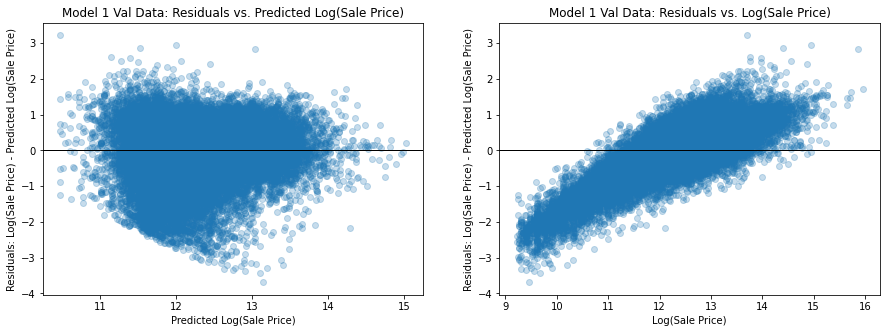

In [36]:
fig, ax = plt.subplots(1,2, figsize=(15, 5))


x_plt1 = Y_predict_valid_m1
y_plt1 = Y_valid_m1 - Y_predict_valid_m1

x_plt2 = Y_valid_m1
y_plt2 = Y_valid_m1 - Y_predict_valid_m1



ax[0].scatter(x_plt1, y_plt1, alpha=.25)
ax[0].axhline(0, c='black', linewidth=1)
ax[0].set_xlabel(r'Predicted Log(Sale Price)')
ax[0].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[0].set_title("Model 1 Val Data: Residuals vs. Predicted Log(Sale Price)")

ax[1].scatter(x_plt2, y_plt2, alpha=.25)
ax[1].axhline(0, c='black', linewidth=1)
ax[1].set_xlabel(r'Log(Sale Price)')
ax[1].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[1].set_title("Model 1 Val Data: Residuals vs. Log(Sale Price)")

# Adding New Features

In [37]:
def process_data_candidates(data):
    
    # Remove Non-Market Sales
    data = data[data["Pure Market Filter"]==1]
    
    data["Log Sale Price"] = np.log(data["Sale Price"])
    
    # Create Log Building Square Feet column
    data["Log Building Square Feet"] = np.log(data["Building Square Feet"])
    
    
    # Create Bedrooms
    data = add_total_bedrooms(data)
     
   
    # Update Roof Material feature with names
    data = substitute_roof_material(data)
    
    # Select columns for comparing residuals
    data = data[['Log Building Square Feet',  'Roof Material', 'Bedrooms', 'Log Sale Price']]

    return data


#Since our residuals are using the validation data, we will just examine these new features on the validation dataset
    
valid_comp = process_data_candidates(valid)
    
valid_comp = valid_comp.assign(M1residuals_log=Y_valid_m1 - Y_predict_valid_m1)

In [38]:
import plotly.express as px

px.box(valid_comp, x='Bedrooms', y='M1residuals_log')

In [39]:
px.box(valid_comp, x='Roof Material', y='M1residuals_log')

In [40]:
def process_data_m2(data):
    
    # You should start by only keeping values with Pure Market Filter = 1

    # Remove outliers
    data1 = data[data['Pure Market Filter']==1]
    
    # Create Log Sale Price column
    data1["Log Sale Price"] = np.log(data1["Sale Price"])
    
    # Create Log Building Square Feet column
    data1["Log Building Square Feet"] = np.log(data1["Building Square Feet"])
    
    # Select columns for the model
    data1 = data1[['Log Building Square Feet', 'Log Sale Price']]
    
    #Create One Hot Encoding Column
    training_data_ohe = ohe_roof_material(training_val_data)
    training_data_ohe_ex = training_data_ohe.filter(regex='^Roof Material_')
    
    return data1.join(training_data_ohe_ex)
    

# Use the same original train and valid datasets from 3a (otherwise the validation errors aren't comparable), 
# Don't resplit the data.  

# # Process the data for Model 2
processed_train_m2 = process_data_m2(train)

processed_val_m2 = process_data_m2(valid)

# Create X (dataframe) and Y (series) to use in the model
X_train_m2 = processed_train_m2.drop(columns = "Log Sale Price")
Y_train_m2 = processed_train_m2['Log Sale Price']

X_valid_m2 = processed_val_m2.drop(columns = "Log Sale Price")
Y_valid_m2 = processed_val_m2['Log Sale Price']


# # Take a look at the result
display(X_train_m2.head())
display(Y_train_m2.head())

display(X_valid_m2.head())
display(Y_valid_m2.head())

,Log Building Square Feet,Roof Material_1.0,Roof Material_2.0,Roof Material_3.0,Roof Material_4.0,Roof Material_5.0,Roof Material_6.0
130829,7.870166,1.0,0.0,0.0,0.0,0.0,0.0
193890,7.002156,1.0,0.0,0.0,0.0,0.0,0.0
30507,6.851185,1.0,0.0,0.0,0.0,0.0,0.0
91308,7.228388,1.0,0.0,0.0,0.0,0.0,0.0
131132,7.990915,1.0,0.0,0.0,0.0,0.0,0.0


130829    12.994530
193890    11.848683
30507     11.813030
91308     13.060488
131132    12.516861
Name: Log Sale Price, dtype: float64

,Log Building Square Feet,Roof Material_1.0,Roof Material_2.0,Roof Material_3.0,Roof Material_4.0,Roof Material_5.0,Roof Material_6.0
50636,7.310550,1.0,0.0,0.0,0.0,0.0,0.0
82485,7.325808,1.0,0.0,0.0,0.0,0.0,0.0
193966,7.090077,1.0,0.0,0.0,0.0,0.0,0.0
160612,7.281386,1.0,0.0,0.0,0.0,0.0,0.0
7028,7.118016,1.0,0.0,0.0,0.0,0.0,0.0


50636     11.682668
82485     12.820655
193966     9.825526
160612    12.468437
7028      12.254863
Name: Log Sale Price, dtype: float64

In [41]:
ohe_model = lm.LinearRegression(fit_intercept=False) 
X = processed_train_m2.drop(columns = 'Log Sale Price')
y = processed_train_m2['Log Sale Price']
ohe_model.fit(X,y)
# your code above this line to create regression model for Model 2

Y_predict_train_m2 = ohe_model.predict(X)

Y_predict_valid_m2 = ohe_model.predict(processed_val_m2.drop(columns = 'Log Sale Price'))

In [42]:
# MODELING STEP 3:  Evaluate the RMSE for the model

# Training and test errors for the model (in its units of Log Sale Price)

training_error_log[1] = rmse(Y_predict_train_m2, Y_train_m2)
validation_error_log[1]= rmse(Y_predict_valid_m2, Y_valid_m2)


# # Training and test errors for the model (in its original values before the log transform)
training_error[1] = rmse(np.exp(Y_predict_train_m2), np.exp(Y_train_m2))
validation_error[1] = rmse(np.exp(Y_predict_valid_m2), np.exp(Y_valid_m2))

In [43]:
# MODELING STEP 4:  Conduct 5-fold cross validation for model and output RMSE

linear_model_m2_cv = lm.LinearRegression(fit_intercept = True)
processed_full_m2 = process_data_m2(training_val_data)

X_full_m2 = processed_full_m2.drop(columns = 'Log Sale Price')
Y_full_m2 = processed_full_m2['Log Sale Price']
# your code above this line to use 5-fold cross-validation and output RMSE (in units of dollars)

cv_error[1] = cross_validate_rmse(linear_model_m2_cv, X_full_m2, Y_full_m2)

print("2nd Model Cross Validation RMSE: {}".format(cv_error[1]))

2nd Model Cross Validation RMSE: 242869.99907619954


In [44]:
model_names[1] = "M2: log(bsqft)+Roof"

fig = go.Figure([
go.Bar(x = model_names, y = training_error, name="Training RMSE"),
go.Bar(x = model_names, y = validation_error, name="Validation RMSE"),
go.Bar(x = model_names, y = cv_error, name="Cross Val RMSE")
])

fig.update_yaxes(range=[180000,260000], title="RMSE")

fig

Text(0.5, 1.0, 'Model 2 Val Data: Residuals vs. Log(Sale Price)')

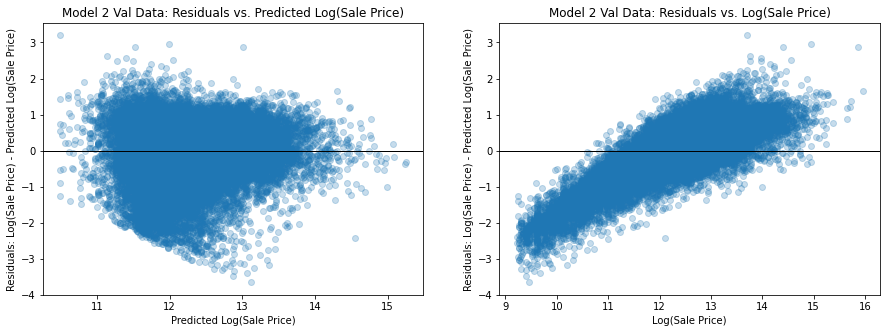

In [45]:
# MODELING STEP 5 cont'd:  Plot 2 side-by-side residual plots (similar to Question 3, for validation data)

fig, ax = plt.subplots(1,2, figsize=(15, 5))


x_plt1 = Y_predict_valid_m2
y_plt1 = Y_valid_m2 - Y_predict_valid_m2

x_plt2 = Y_valid_m2
y_plt2 = Y_valid_m2 - Y_predict_valid_m2


ax[0].scatter(x_plt1, y_plt1, alpha=.25)
ax[0].axhline(0, c='black', linewidth=1)
ax[0].set_xlabel(r'Predicted Log(Sale Price)')
ax[0].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[0].set_title("Model 2 Val Data: Residuals vs. Predicted Log(Sale Price)")

ax[1].scatter(x_plt2, y_plt2, alpha=.25)
ax[1].axhline(0, c='black', linewidth=1)
ax[1].set_xlabel(r'Log(Sale Price)')
ax[1].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[1].set_title("Model 2 Val Data: Residuals vs. Log(Sale Price)")

# Improving The Model

In [46]:
# wanted to use Neighborhood Code but it did not work really well with the data, that's why I chose to use Town Code

def ohe_town_code(data):
    """
    One-hot-encodes roof material.  New columns are of the form "Roof Material_MATERIAL"
    """
    ohe = OneHotEncoder()
    ohe.fit(data[["Town Code"]])
    #encoded_roofmaterial_df = pd.DataFrame(oh_enc.transform(data[["Roof Material"]]).toarray(),columns=ohe.get_feature_names_out(),index = data.index)
    new_df = pd.DataFrame(ohe.transform(data[["Town Code"]]).toarray(),
                            columns=ohe.get_feature_names_out(),
                            index = data.index)
    
    encoded_roofmaterial_df = pd.concat([data, new_df], axis=1)
    
    return encoded_roofmaterial_df

In [47]:
training_data_ohe = ohe_town_code(training_data)
#This line of code will display only the one-hot-encoded columns in training_data_ohe that 
# have names that begin with “Town Code_" 
training_data_ohe.filter(regex='^Town Code_').head(5)

,Town Code_10,Town Code_11,Town Code_12,Town Code_13,Town Code_14,Town Code_15,Town Code_16,Town Code_17,Town Code_18,Town Code_19,...,Town Code_38,Town Code_39,Town Code_70,Town Code_71,Town Code_72,Town Code_73,Town Code_74,Town Code_75,Town Code_76,Town Code_77
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [48]:
#corr between Estimate (Land) and Sale Price = 0.523583

def process_data_m3(data):
    
    # You should start by only keeping values with Pure Market Filter = 1
    
    data1 = data[data['Pure Market Filter']==1]
    
    # Create Log Sale Price column
    data1["Log Sale Price"] = np.log(data1["Sale Price"])
    
    # Create Log Building Square Feet column
    data1["Log Building Square Feet"] = np.log(data1["Building Square Feet"])
    
    # Create Log Estimate (Building) column
    # There are some values that become -inf
    data1['Log Estimate (Building)'] = np.log(data1['Estimate (Building)']+1)
    
    # Select columns for the model
    data1 = data1[['Log Building Square Feet','Log Estimate (Building)', 'Log Sale Price']]

    
    #Create One Hot Encoding Column
    training_data_ohe = ohe_town_code(training_val_data)
    training_data_ohe_ex = training_data_ohe.filter(regex='^Town Code_')
    
    return data1.join(training_data_ohe_ex)

    
# Use the same original train and valid datasets from 3a 
#(otherwise the validation errors aren't comparable), 
# Don't resplit the data.  


# Process the data for Model 3
processed_train_m3 = process_data_m3(train)

processed_val_m3 = process_data_m3(valid)

# Create X (Dataframe) and Y (series) to use to train the model
X_train_m3 = processed_train_m3.drop(columns = 'Log Sale Price')
Y_train_m3 = processed_train_m3['Log Sale Price']

# print(X_train_m3.min())
# print(X_train_m3.max())


X_valid_m3 = processed_val_m3.drop(columns = 'Log Sale Price')
Y_valid_m3 = processed_val_m3['Log Sale Price']

# print(X_valid_m3.min())
# print(X_valid_m3.max())

# Take a look at the result
display(X_train_m3.head())
display(Y_train_m3.head())

display(X_valid_m3.head())
display(Y_valid_m3.head())

,Log Building Square Feet,Log Estimate (Building),Town Code_10,Town Code_11,Town Code_12,Town Code_13,Town Code_14,Town Code_15,Town Code_16,Town Code_17,...,Town Code_38,Town Code_39,Town Code_70,Town Code_71,Town Code_72,Town Code_73,Town Code_74,Town Code_75,Town Code_76,Town Code_77
130829,7.870166,13.019934,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
193890,7.002156,10.969766,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
30507,6.851185,11.569599,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
91308,7.228388,12.839685,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
131132,7.990915,12.357553,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


130829    12.994530
193890    11.848683
30507     11.813030
91308     13.060488
131132    12.516861
Name: Log Sale Price, dtype: float64

,Log Building Square Feet,Log Estimate (Building),Town Code_10,Town Code_11,Town Code_12,Town Code_13,Town Code_14,Town Code_15,Town Code_16,Town Code_17,...,Town Code_38,Town Code_39,Town Code_70,Town Code_71,Town Code_72,Town Code_73,Town Code_74,Town Code_75,Town Code_76,Town Code_77
50636,7.310550,11.669767,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
82485,7.325808,12.264676,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
193966,7.090077,10.669908,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
160612,7.281386,12.154100,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7028,7.118016,11.355581,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


50636     11.682668
82485     12.820655
193966     9.825526
160612    12.468437
7028      12.254863
Name: Log Sale Price, dtype: float64

In [49]:
lm_model_3 = lm.LinearRegression(fit_intercept=False)
X_3 = processed_train_m3.drop(columns = 'Log Sale Price')
y_3 = processed_train_m3['Log Sale Price']
lm_model_3.fit(X_3,y_3)

# your code above this line to create regression model for Model 3

Y_predict_train_m3 = lm_model_3.predict(X_3)

Y_predict_valid_m3 = lm_model_3.predict(processed_val_m3.drop(columns = 'Log Sale Price'))

In [50]:
# MODELING STEP 3:  Evaluate the RMSE for your model

# Training and test errors for the model (in its units of Log Sale Price)

training_error_log[2] = rmse(Y_predict_train_m3, Y_train_m3)
validation_error_log[2]= rmse(Y_predict_valid_m3, Y_valid_m3)

# Training and test errors for the model (in its original values before the log transform)
training_error[2] = rmse(np.exp(Y_predict_train_m3), np.exp(Y_train_m3))
validation_error[2] = rmse(np.exp(Y_predict_valid_m3), np.exp(Y_valid_m3))


(print("3rd Model\nTraining RMSE (log): {}\nValidation RMSE (log): {}\n"
      .format(training_error_log[2], validation_error_log[2]))
)

(print("3rd Model \nTraining RMSE: {}\nValidation RMSE: {}\n"
       .format(training_error[2], validation_error[2]))
)

3rd Model
Training RMSE (log): 0.5658466277320333
Validation RMSE (log): 0.5633294958990946

3rd Model 
Training RMSE: 174938.79104248327
Validation RMSE: 180518.90117795454



In [51]:
linear_model_m3_cv = lm.LinearRegression(fit_intercept = True)
processed_full_m3 = process_data_m3(training_val_data)

X_full_m3 = processed_full_m3.drop(columns = 'Log Sale Price')
Y_full_m3 = processed_full_m3['Log Sale Price']
# your code above this line to use 5-fold cross-validation and 
#output RMSE (in units of dollars)

cv_error[2] = cross_validate_rmse(linear_model_m3_cv, X_full_m3, Y_full_m3)

print("3rd Model Cross Validation RMSE: {}".format(cv_error[2]))

3rd Model Cross Validation RMSE: 176093.8691040213


In [52]:
model_names[2] = "M3: log(bsqft)+Estimate(Building)+Town"


fig = go.Figure([
go.Bar(x = model_names, y = training_error, name="Training RMSE"),
go.Bar(x = model_names, y = validation_error, name="Validation RMSE"),
go.Bar(x = model_names, y = cv_error, name="Cross Val RMSE")
])

fig.update_yaxes(range=[160000,260000], title="RMSE")

fig

Text(0.5, 1.0, 'Model 3 Val Data: Residuals vs. Log(Sale Price)')

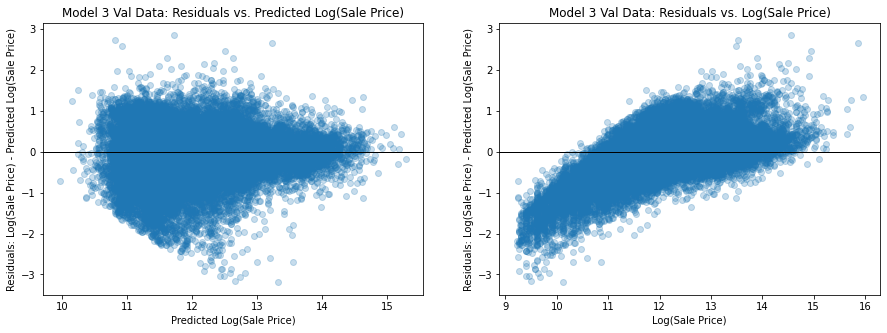

In [53]:
fig, ax = plt.subplots(1,2, figsize=(15, 5))


x_plt1 = Y_predict_valid_m3
y_plt1 = Y_valid_m3 - Y_predict_valid_m3

x_plt2 = Y_valid_m3
y_plt2 = Y_valid_m3 - Y_predict_valid_m3


ax[0].scatter(x_plt1, y_plt1, alpha=.25)
ax[0].axhline(0, c='black', linewidth=1)
ax[0].set_xlabel(r'Predicted Log(Sale Price)')
ax[0].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[0].set_title("Model 3 Val Data: Residuals vs. Predicted Log(Sale Price)")

ax[1].scatter(x_plt2, y_plt2, alpha=.25)
ax[1].axhline(0, c='black', linewidth=1)
ax[1].set_xlabel(r'Log(Sale Price)')
ax[1].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[1].set_title("Model 3 Val Data: Residuals vs. Log(Sale Price)")